In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline

In [ ]:
df=pd.read_csv('Clean_Dataset.csv')
df.head(2)

,Unnamed: 0,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300153 entries, 0 to 300152
Data columns (total 12 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        300153 non-null  int64  
 1   airline           300153 non-null  object 
 2   flight            300153 non-null  object 
 3   source_city       300153 non-null  object 
 4   departure_time    300153 non-null  object 
 5   stops             300153 non-null  object 
 6   arrival_time      300153 non-null  object 
 7   destination_city  300153 non-null  object 
 8   class             300153 non-null  object 
 9   duration          300153 non-null  float64
 10  days_left         300153 non-null  int64  
 11  price             300153 non-null  int64  
dtypes: float64(1), int64(3), object(8)
memory usage: 27.5+ MB


In [ ]:
df.isnull().sum()

Unnamed: 0          0
airline             0
flight              0
source_city         0
departure_time      0
stops               0
arrival_time        0
destination_city    0
class               0
duration            0
days_left           0
price               0
dtype: int64

In [ ]:
df['stops'].unique()

array(['zero', 'one', 'two_or_more'], dtype=object)

In [ ]:
df['stops']=df['stops'].map({'zero': 'No Stop', 'one': '1 Stop', "two_or_more": '2 Stop'}).astype('category')

In [ ]:
df['departure_time'].unique()

array(['Evening', 'Early_Morning', 'Morning', 'Afternoon', 'Night',
       'Late_Night'], dtype=object)

In [ ]:
df['departure_time'] = df['departure_time'].replace({
    'Early_Morning': 'Morning',
    'Late_Night': 'Night'
})

In [ ]:
df['arrival_time'].unique()

array(['Night', 'Morning', 'Early_Morning', 'Afternoon', 'Evening',
       'Late_Night'], dtype=object)

In [ ]:
df['arrival_time'] = df['arrival_time'].replace({
    'Early_Morning': 'Morning',
    'Late_Night': 'Night'
})

In [ ]:
df.drop(columns=['flight', 'Unnamed: 0'], inplace=True)

In [ ]:
df = df.astype({
    'days_left': 'int32',
    'price': 'int32',
    'duration': 'int32'
})

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300153 entries, 0 to 300152
Data columns (total 10 columns):
 #   Column            Non-Null Count   Dtype   
---  ------            --------------   -----   
 0   airline           300153 non-null  object  
 1   source_city       300153 non-null  object  
 2   departure_time    300153 non-null  object  
 3   stops             300153 non-null  category
 4   arrival_time      300153 non-null  object  
 5   destination_city  300153 non-null  object  
 6   class             300153 non-null  object  
 7   duration          300153 non-null  int32   
 8   days_left         300153 non-null  int32   
 9   price             300153 non-null  int32   
dtypes: category(1), int32(3), object(6)
memory usage: 17.5+ MB


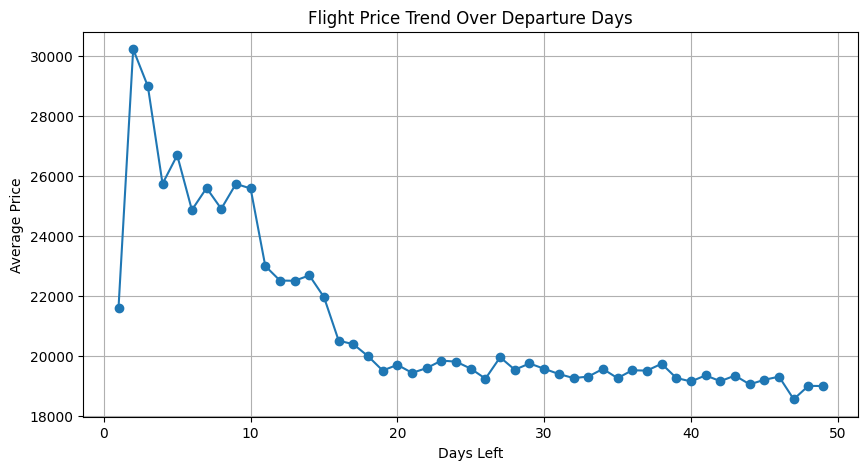

In [ ]:
avg_price_per_day = df.groupby('days_left')['price'].mean()


plt.figure(figsize=(10,5))
plt.plot(avg_price_per_day.index, avg_price_per_day.values, marker='o', linestyle='-')
plt.xlabel("Days Left")
plt.ylabel("Average Price")
plt.title("Flight Price Trend Over Departure Days")
plt.grid(True)
plt.show()

Text(0, 0.5, 'Count')

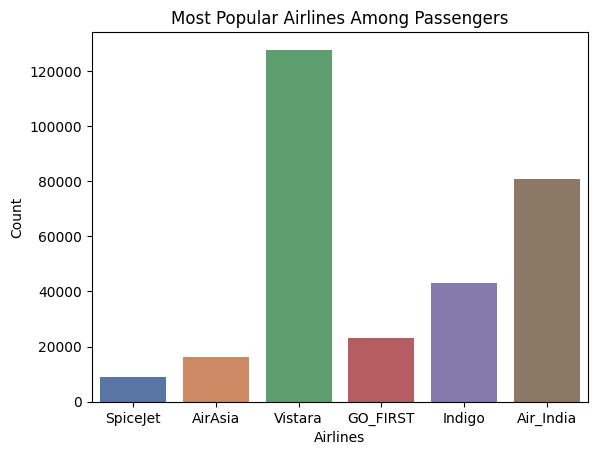

In [ ]:
sns.countplot(x=df['airline'], data=df, hue=df['airline'], palette='deep')
plt.title('Most Popular Airlines Among Passengers')
plt.xlabel('Airlines')
plt.ylabel('Count')

<Axes: xlabel='arrival_time', ylabel='count'>

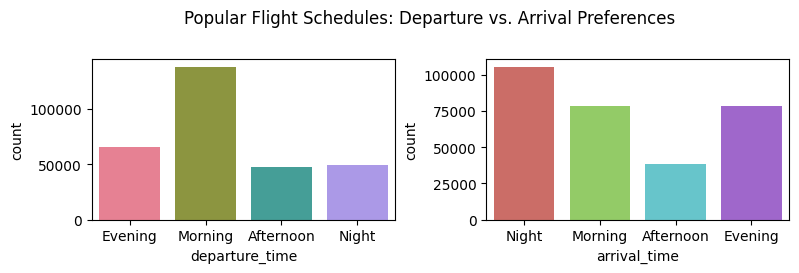

In [ ]:
plt.figure(figsize=(9,5))
plt.suptitle('Popular Flight Schedules: Departure vs. Arrival Preferences')
plt.subplots_adjust(hspace=0.4, wspace=0.3)

plt.subplot(2,2,1)
sns.countplot(x=df['departure_time'], data=df, hue=df['departure_time'], palette='husl')

plt.subplot(2,2,2)
sns.countplot(x=df['arrival_time'], data=df, hue=df['arrival_time'], palette='hls')

In [ ]:
fig = px.bar(df.groupby("airline")["price"].mean().reset_index(),
             x="airline", y="price",
             color="airline", text="price",
             title="Average Ticket Price by Airline")
fig.update_traces(texttemplate='%{text:.2f}', textposition='auto')
fig.show()

In [ ]:
fig = px.density_heatmap(df, x="destination_city", y="source_city",
                         z="price", color_continuous_scale="Viridis",
                         title="Flight Price Trends Between Cities")
fig.show()

In [ ]:
fig = px.bar(df.groupby("class")["price"].mean().reset_index(),
             x="class", y="price",
             color="class", text="price",
             title="Average Ticket Price by Class")
fig.update_traces(texttemplate='%{text:.2f}', textposition='auto')
fig.show()

C:\Users\mahim\AppData\Local\Temp\ipykernel_11080\1897282225.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



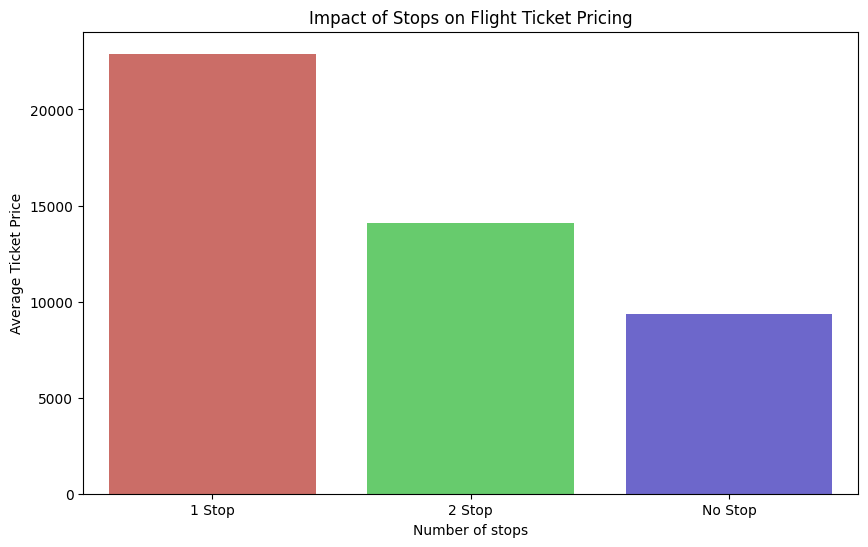

In [ ]:
avg_price_per_stop=df.groupby("stops")["price"].mean()

plt.figure(figsize=(10,6))
sns.barplot(x=avg_price_per_stop.index, y=avg_price_per_stop.values, hue=avg_price_per_stop.index, palette='hls')
plt.xlabel('Number of stops')
plt.ylabel('Average Ticket Price')
plt.title('Impact of Stops on Flight Ticket Pricing')
plt.xticks(ticks=avg_price_per_stop.index)
plt.show()

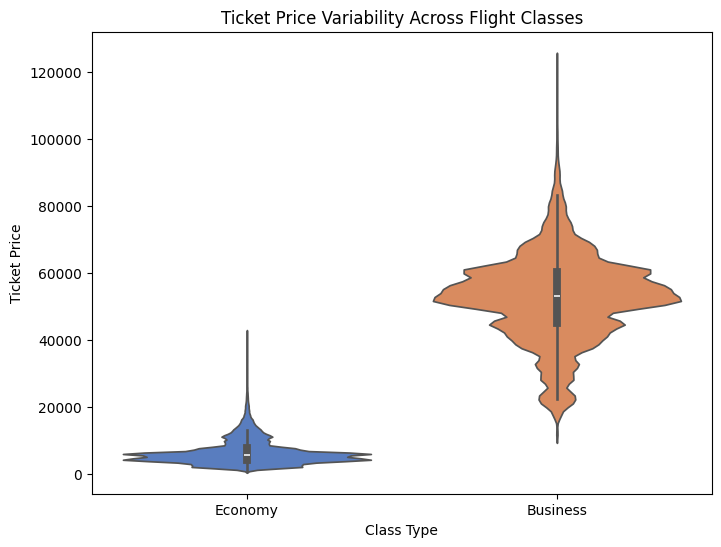

In [ ]:
plt.figure(figsize=(8,6))
sns.violinplot(x=df['class'], y=df['price'], hue=df['class'], palette="muted")
plt.xlabel("Class Type")
plt.ylabel("Ticket Price")
plt.title("Ticket Price Variability Across Flight Classes")
plt.show()

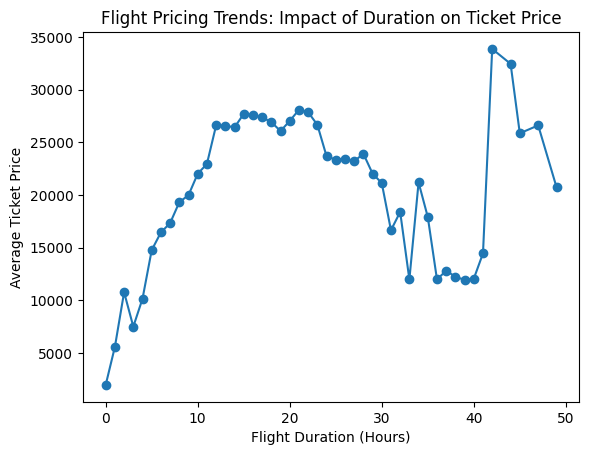

In [ ]:
grouped_hours=df.groupby('duration')['price'].mean()
plt.plot(grouped_hours.index, grouped_hours.values, marker='o', linestyle='-')

plt.title("Flight Pricing Trends: Impact of Duration on Ticket Price")
plt.xlabel("Flight Duration (Hours)")
plt.ylabel("Average Ticket Price")
plt.show()